### SSP Dynamics with Multiple Independent Objects

This notebook illustrates how changing compound motions can be independently applied to distinct objects encoded into a single SSP. The general idea is bind (x, y) position encodings to encodings of particular objects. Each SSP is then a sum of position encodings, and to update the position of single object by some $\Delta x, \Delta y$, the following steps are taken. 

First, the currently represented x, y coordinates of the object are decoded: 

$X^x \circledast Y^y \approx SSP \circledast OBJ^{-1}$.

By comparing this decoded position representation to a known set of positions representations that tile the environment, it is possible to determine numerical $x, y$ coordinates. Second, a new encoding of the coordinates of the object's updated position is created: 

$X^{x+\Delta x} \circledast Y^{y+\Delta y}$

Third, the difference between these position encodings is computed:

$\Delta P = X^{x+\Delta x} \circledast Y^{y+\Delta y} - X^x \circledast Y^y$

Finally, the SSP is updated as follows: 

$SSP \mathrel{+}= OBJ \circledast \Delta P$

This last step works because the SSP now encodes

$OBJ \circledast X^x \circledast Y^y + OBJ \circledast (X^{x+\Delta x} \circledast Y^{y+\Delta y} - \circledast X^x \circledast Y^y) = OBJ \circledast X^{x+\Delta x} \circledast Y^{y+\Delta y}$

due to the properties of fractional HRR powers. 

This notebook also looks at various ways of simulating dynamics with SSPs and examines the limitations associated with each approach. Ideally, one would like to encode a variety of objects in a single SSP and apply a single transformation to the SSP to advance the position of each object along its own unique trajectory. Earlier work illustrates that it is straightforward to apply a linear transformation that advances the position of a single object in isolation, or a linear transformation that advances the position of all objects identically. 

In [1]:
%matplotlib inline

import string

from IPython.display import HTML
import numpy as np

from ssp.maps import Spatial2D
from ssp.models import Linear, MLP
from ssp.dynamics import Trajectory
from ssp.plots import heatmap_animation, create_gif
from ssp.utils import create_data, converging_trajectory
from functools import partial

In [2]:
dim = 256
scale = 10

t = 4
dt = 0.05
n_steps = int(t / dt)

x_len = 2
y_len = 2
x_spaces = 101
y_spaces = 101

init_x = 1
init_y = 1

ssp_map = Spatial2D(dim=dim, scale=scale)
ssp_map.build_grid(x_len, y_len, x_spaces, y_spaces)

#### 1. Initial Demo of Dynamics with Two Objects

As a first step, we can define an SSP that encodes two objects and generate dynamics that move each object in a distinct oscillatory pattern.

In [3]:
 # define scene trajectories with two objects using differential equations 
traj_a = Trajectory(t, dt)
traj_b = Trajectory(t, dt)

names = ['A', 'B']
signs = [-1, 1]

for sign, name in zip(signs, names):
    dxdt = partial(lambda sign, t: sign * np.sin(t * np.pi), sign)
    dydt = partial(lambda sign, t: sign * np.cos(t * np.pi), sign)
    traj_a.add_object_spec(name, 1, 1, dxdt, dydt)

for sign, name in zip(signs, names):
    dxdt = partial(lambda sign, t: sign * np.sin(t * np.pi), sign)
    dydt = partial(lambda sign, t: -1 * sign * np.cos(t * np.pi), sign)
    traj_b.add_object_spec(name, 1, 1, dxdt, dydt)


# generate the dynamics using the method of addition describe above
a_sims = []
ssp = ssp_map.initialize_ssp(traj_a)
cue = ssp_map.initialize_cue(traj_a)

for new_ssp in ssp_map.algebraic_dynamics_gen(traj_a):
    a_sims.append(ssp_map.compute_heatmap(new_ssp * cue))

b_sims = []
ssp = ssp_map.initialize_ssp(traj_b)
cue = ssp_map.initialize_cue(traj_b)

for new_ssp in ssp_map.algebraic_dynamics_gen(traj_b):
    b_sims.append(ssp_map.compute_heatmap(new_ssp * cue))


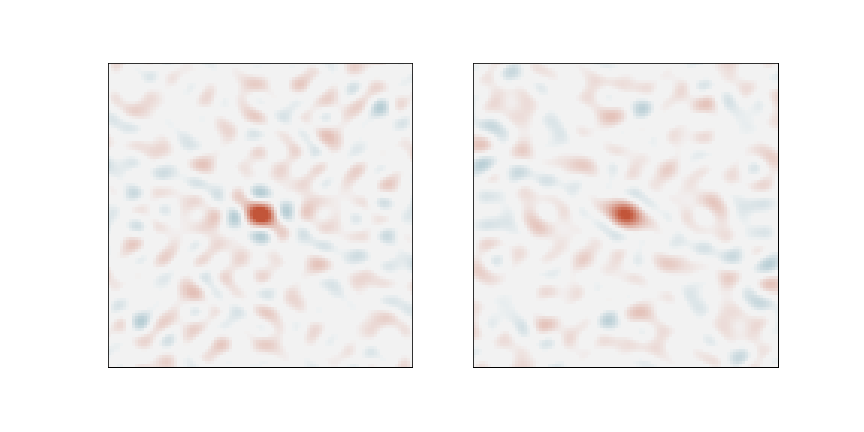

In [4]:
# plot the results
sims = [a_sims, b_sims]
figsize = (12, 6)

ani = heatmap_animation(sims, figsize)

HTML('<img src="data:image/gif;base64,{0}" />'.format(create_gif(ani)))

#### 2. Approximating Dynamics with Linear and Non-linear Models

Here, we use function approximation to learn a mapping that matches each SSP along a trajectory to its successor. The linear model is just a matrix learned through gradient descent that is repeatedly applied to an input SSP; the SSP therefore converges on the eigenvector of the matrix with the largest eigenvalue, assuming the SSP is not intitially orthogonal to this eigenvector. The non-linear model is an MLP also trained through gradient descent to match each SSP along a trajectory to its successor. The loss used is mean squared error defined with respect to training trajectories. Here we use a single training trajectory to start (though the tractory involves multiple objects).

In [5]:
trajectories = [traj_a]
xs, ys = create_data(ssp_map, trajectories)

linear_model = Linear(x_dim=dim, y_dim=dim)
linear_model.train(xs, ys, n_steps=1000)

nonlinear_model = MLP(x_dim=dim, h_dims=[512], y_dim=dim)
nonlinear_model.train(xs, ys, n_steps=1000)

ssp = ssp_map.initialize_ssp(traj_a)
cue = ssp_map.initialize_cue(traj_a)

algebraic_sims = []
for new_ssp in ssp_map.algebraic_dynamics_gen(traj_a):
    algebraic_sims.append(ssp_map.compute_heatmap(new_ssp * cue))
    
linear_sims = []
for new_ssp in ssp_map.modelled_dynamics_gen(n_steps, ssp, linear_model):
    linear_sims.append(ssp_map.compute_heatmap(new_ssp * cue))
    
nonlinear_sims = []
for new_ssp in ssp_map.modelled_dynamics_gen(n_steps, ssp, nonlinear_model):
    nonlinear_sims.append(ssp_map.compute_heatmap(new_ssp * cue))

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.


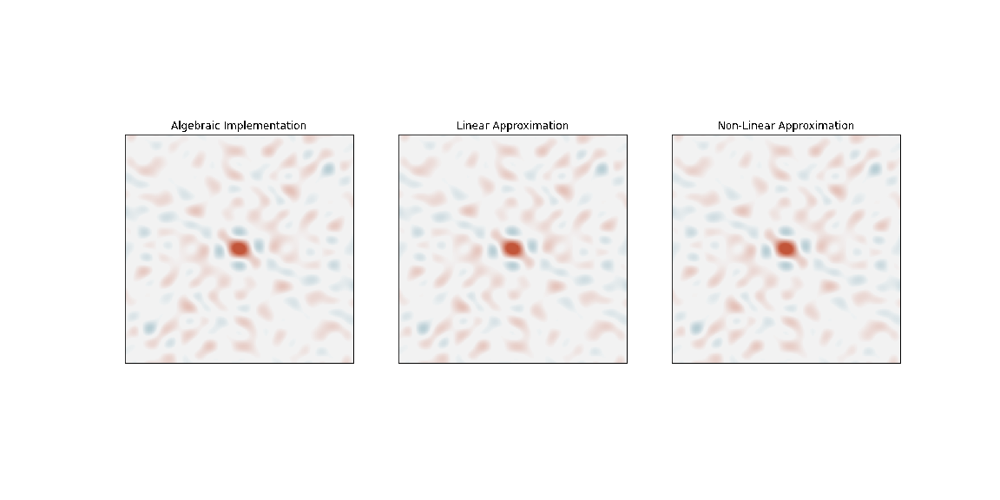

In [6]:
# plot the results
figsize = (16, 8)
sims = [algebraic_sims, linear_sims, nonlinear_sims]
titles = ['Algebraic Implementation', 'Linear Approximation', 'Non-Linear Approximation']

ani = heatmap_animation(sims, figsize, titles)
HTML('<img src="data:image/gif;base64,{0}" />'.format(create_gif(ani)))

#### 3. Approximating Dynamics from Multiple Sample Trajectories

In the examples so far, function approximation has been used to model a single trajectory. Here, we'll train on two trajectories to begin testing approaches to performing interesting kinds of generalization. This doesn't work particularly well, except insofar as the non-linear approximator can "memorize" a set of trajectories associated with different initial starting points. 

In [ ]:
trajectories = []
# create copies of trajectories with different initial positions
for count in range(2):
    traj = Trajectory(t, dt)
    x = count / 2 + 0.5
    y = count / 2 + 0.5 
    for sign, name in zip(signs, names):
        dxdt = partial(lambda sign, t: sign * np.sin(t * np.pi), sign)
        dydt = partial(lambda sign, t: sign * np.cos(t * np.pi), sign)
        traj.add_object_spec(name, x, y, dxdt, dydt)
        
    trajectories.append(traj)

xs, ys = create_data(ssp_map, trajectories, add_noise=True)

linear_model.train(xs, ys, n_steps=1000)
nonlinear_model.train(xs, ys, n_steps=1000)

ssp = ssp_map.initialize_ssp(trajectories[1])
cue = ssp_map.initialize_cue(trajectories[1])

algebraic_sims = []
for new_ssp in ssp_map.algebraic_dynamics_gen(trajectories[1]):
    algebraic_sims.append(ssp_map.compute_heatmap(new_ssp * cue))
    
linear_sims = []
for new_ssp in ssp_map.modelled_dynamics_gen(n_steps, ssp, linear_model):
    linear_sims.append(ssp_map.compute_heatmap(new_ssp * cue))
    
nonlinear_sims = []
for new_ssp in ssp_map.modelled_dynamics_gen(n_steps, ssp, nonlinear_model):
    nonlinear_sims.append(ssp_map.compute_heatmap(new_ssp * cue))

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

In [ ]:
# plot the results
figsize = (16, 8)
sims = [algebraic_sims, linear_sims, nonlinear_sims]
titles = ['Algebraic Implementation', 'Linear Approximation', 'Non-Linear Approximation']

ani = heatmap_animation(sims, figsize, titles)
HTML('<img src="data:image/gif;base64,{0}" />'.format(create_gif(ani)))

### Conclusion

There are three currently identified approaches to simulating the dynamics of multiple objects. The first, rudimentary approach (not implemented here) involves encoding the scene as a sum of position encodings, and then applying transformations to this sum:

$SSP=X^{x_1}\circledast Y^{y_1} + X^{x_2}\circledast Y^{y_2}...$

$SSP \mathrel{*}= X^{\Delta x} \circledast Y^{\Delta y}$

The drawback of this approach is that it is difficult to apply a transformation that has distinct effects on distinct objects (though function approximation would likely work in this context). 

The second approach involves tagging each set coordinates with a representation of the corresponding object, and then applying transformations to update the position of each object independently.

$SSP \mathrel{+}= OBJ \circledast \Delta P$

where

$\Delta P = X^{x+\Delta x} \circledast Y^{y+\Delta y} - X^x \circledast Y^y$

The drawbacks of this approach are that multiple operations are needed to update the SSP (one for each encoded object), and that generating the $\Delta P$ transformation requires already knowing the future position of the object that results from applying the transformation.


The third approach involves approximating a function that repeatedly transforms the SSP by mapping it to a new SSP corresponding to the next point along some trajectory. 

$ SSP = f(SSP) $

where $f$ is a function approximated from training data. The drawback of this approach is that it is kind of like creating a lookup table given the fact that SSPs encodings of nearby positions are approximately orthogonal by design. Importantly, this means that the function does not take into account the history of the SSP, only it's current state, which could cause issues in cases where multiple training trajectories that cross paths are used as training data. RNNs that track the history of the SSP could solve this problem.  

One idea for a further approach involves approximating a function that predicts a transformation SSP at each timestep that gets applied to a state SSP (e.g., via addition or convolution). However, this likely just adds a step of indirection to the results achieved using the basic function approximation approach, since from the perspective of training the approximator, it's not clear there's much of a difference between predicting a transformation vector and predicting the result of applying this transformation vector. 

Another idea involves relaxing the scaling used during SSP encoding that governs the degree of similarity between vectors corresponding to neighboring points along some continuous dimensions (e.g. the X, Y axes of the 2D planes above). In fact, scaling that acts to orthogonalize vectors for nearby points along each dimension arguably defeats the whole purpose of using distributed representations, since this orthogonalization reduces the degree of representational similarity between SSPs corresponding to scenes with similar objects in similar locations. By relaxing scaling, generalization can be fostered, but at the expense of less precise scene representations (e.g. the space occupied by each object gets larger due to transfer over the tilings points used to create each heatmap; reducing the scale thereby lowers the resolution of the representation). Judicious applications of cleanup memories might help in this context.